<h1>IRANIAN TELECOM CUSTOMER CHURN PREDICTION</h1>

### Dataset

This dataset, collected randomly from an Iranian telecom company's database over 12 months, consists of 3150 rows representing customers, with information of their usage of the service across 13 fields. Notably, all attributes, except *churn*, present aggregated data for the initial 9 months. Churn labels indicate customer states after 12 months, with a designated 3-month planning gap.

**Data Attributes:**

- **`Call Failures`**: Number of call failures
- **`Complains`**: Complain status to show whether the customer complained or not (0: No complaint, 1: Complaint)
- **`Subscription Length`**: Total subscription months of the customer
- **`Charge Amount`**:
- **`Seconds of Use`**: Total seconds that the customer called
- **`Frequency of Use`**: Total number of calls made
- **`Frequency of SMS`**: Total text messages made
- **`Distinct Called Numbers`**: Total distinct phone calls
- **`Age Group`**: Customer age group
- **`Tariff Plan`**: Tariff Plan of the customer
- **`Status`**: Customer active status
- **`Churn`**: Customer churn status
- **`Customer Value`**: Calculated customer value

### Goals

This notebook goal is to come up with a machine learning model to **predict the churn status** of customer

## Import Libraries

Import necessary libraries that support performing data analysis and manipulation, building and training models as well as evaluating those models.

In [128]:
# Importing Analytical packages - Pandas, Numpy, Seaborn, Scipy, 
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.style as style; 
style.use('seaborn-v0_8-dark')

# Suppress warnings
import warnings; warnings.filterwarnings('ignore')


# Modelling
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, accuracy_score, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold

from sklearn.linear_model import LogisticRegression, LinearRegression, RidgeCV
from sklearn.neighbors import KNeighborsClassifier


#transformation
from sklearn import preprocessing
from sklearn.pipeline import Pipeline

from imblearn.over_sampling import SMOTE

#Style the plot to center
from IPython.core.display import HTML
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

## 1. Import Data and General Overview

In [6]:
# Reading the data as dataframe
dataset_path = 'iranian_customer_churn.csv'

df = pd.read_csv(dataset_path)

In [7]:
# General observation upon the dataset
print('\n____________ Dataset info ____________')
display(df.info())              
print('\n____________ Statistics of numeric features ____________')
display(df.describe())  
print('\n____________ Some first data examples ____________')
df.head(3)



____________ Dataset info ____________
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3150 entries, 0 to 3149
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Call  Failure            3150 non-null   int64  
 1   Complains                3150 non-null   int64  
 2   Subscription  Length     3150 non-null   int64  
 3   Charge  Amount           3150 non-null   int64  
 4   Seconds of Use           3150 non-null   int64  
 5   Frequency of use         3150 non-null   int64  
 6   Frequency of SMS         3150 non-null   int64  
 7   Distinct Called Numbers  3150 non-null   int64  
 8   Age Group                3150 non-null   int64  
 9   Tariff Plan              3150 non-null   int64  
 10  Status                   3150 non-null   int64  
 11  Age                      3150 non-null   int64  
 12  Customer Value           3150 non-null   float64
 13  Churn                    3150 non-null

None


____________ Statistics of numeric features ____________


,Call Failure,Complains,Subscription Length,Charge Amount,Seconds of Use,Frequency of use,Frequency of SMS,Distinct Called Numbers,Age Group,Tariff Plan,Status,Age,Customer Value,Churn
count,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000
mean,7.627937,0.076508,32.541905,0.942857,4472.459683,69.460635,73.174921,23.509841,2.826032,1.077778,1.248254,30.998413,470.972916,0.157143
std,7.263886,0.265851,8.573482,1.521072,4197.908687,57.413308,112.237560,17.217337,0.892555,0.267864,0.432069,8.831095,517.015433,0.363993
min,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,15.000000,0.000000,0.000000
25%,1.000000,0.000000,30.000000,0.000000,1391.250000,27.000000,6.000000,10.000000,2.000000,1.000000,1.000000,25.000000,113.801250,0.000000
50%,6.000000,0.000000,35.000000,0.000000,2990.000000,54.000000,21.000000,21.000000,3.000000,1.000000,1.000000,30.000000,228.480000,0.000000
75%,12.000000,0.000000,38.000000,1.000000,6478.250000,95.000000,87.000000,34.000000,3.000000,1.000000,1.000000,30.000000,788.388750,0.000000
max,36.000000,1.000000,47.000000,10.000000,17090.000000,255.000000,522.000000,97.000000,5.000000,2.000000,2.000000,55.000000,2165.280000,1.000000



____________ Some first data examples ____________


,Call Failure,Complains,Subscription Length,Charge Amount,Seconds of Use,Frequency of use,Frequency of SMS,Distinct Called Numbers,Age Group,Tariff Plan,Status,Age,Customer Value,Churn
0,8,0,38,0,4370,71,5,17,3,1,1,30,197.640,0
1,0,0,39,0,318,5,7,4,2,1,2,25,46.035,0
2,10,0,37,0,2453,60,359,24,3,1,1,30,1536.520,0


#### Observation 1
- Dataset has 3150 rows and 14 columns with no missing values
- Columns have **typo errors**:
    - double space instead of one, replace those for further operation
    - wrong capitalized (**Frequency of use**)

In [9]:
# Fix double space
df.columns = df.columns.str.replace("  ", " ")

# Fix capitalized
df = df.rename(columns={'Frequency of use': 'Frequency of Use'})

## 2. Exploratory Data Analysis

### 2.1. General Overview
General summary of all attributes.

In [12]:
# Five point summary of attributes
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Call Failure,3150.0,7.627937,7.263886,0.0,1.00000,6.00,12.00000,36.00
Complains,3150.0,0.076508,0.265851,0.0,0.00000,0.00,0.00000,1.00
Subscription Length,3150.0,32.541905,8.573482,3.0,30.00000,35.00,38.00000,47.00
Charge Amount,3150.0,0.942857,1.521072,0.0,0.00000,0.00,1.00000,10.00
Seconds of Use,3150.0,4472.459683,4197.908687,0.0,1391.25000,2990.00,6478.25000,17090.00
Frequency of Use,3150.0,69.460635,57.413308,0.0,27.00000,54.00,95.00000,255.00
Frequency of SMS,3150.0,73.174921,112.237560,0.0,6.00000,21.00,87.00000,522.00
Distinct Called Numbers,3150.0,23.509841,17.217337,0.0,10.00000,21.00,34.00000,97.00
Age Group,3150.0,2.826032,0.892555,1.0,2.00000,3.00,3.00000,5.00
Tariff Plan,3150.0,1.077778,0.267864,1.0,1.00000,1.00,1.00000,2.00


#### Observation 2 - information on the type of variable and min-max values
- **`Call Failure`**: numerical, quantitative, interval (1), with the least as 0 fails and 36 as most recorded.
- **`Complains`**: categorical(binary), quantitative, nominal with 0 is no complaint and 1 is complaint existed.
- **`Subscription Length`**: numerical, quantitative, interval (1). total months of subscriptions, with the shortest period is 3 months and the longest is 47 months.
- **`Charge Amount`** ordinal, quantitative, ordinal. 0 is the lowest amount and 10 as the highest recorded amount (this is an error that need to be handled, as due to the definition of the dataset, max value should only be 9).
- **`Seconds of Use`** numerical(continuous), quantitative, interval. 0 second is the least amount of used time and 17090 seconds as the most.
- **`Frequency of Use`** numerical(continuous), quantitative, interval. Records the amount of usage time, with the min as 0 and max as 255 times.
- **`Frequency of SMS`** numerical(continuous), quantitative, ratio. 0 is the min text message and 522 texts is the most recorded
- **`Distinct Called Number`** numerical(continuous), quantitative, ratio. 0 is the least distinct phone number called, 97 is the most.
- **`Age Group`** categorical, qualitative, ordinal. youngest age is 1 and 5 being the oldest.
- **`Tariff Plan`** categorical(binary), qualitative, nominal. 1 is *Pay as you go*, 2 is *contractual*.
- **`Status`** categorical(binary), qualitative, nominal. 1 is active, 2 is non-active.
- **`Age`** numerical, quantitative, ratio. youngest is 15, oldest is 55.
- **`Churn`**, **Target Value for Classification**, categorical(binary), qualitative, nominal. 1 as *churn*, 0 as *non-churn*. 
- **`Customer Value`**, **Target Value for Regression**, numerical(continuous), quantitative, interval. 0 is lowest and 2165.28 is the highest.

### 2.2. Detailed Observation

#### Observation 3 - Descriptive Statistics for the numerical variables
Descriptive statistics and diagrams for the numerical variables (Call Failure, Seconds of use, Frequency of use, Frequency of SMS, Distinct Called Number, Subscription Length, Age, Customer Value)

In [15]:
# Define a function to plot and examine the distribution of numerical attributes
def plot_distribution_box(column, font_scale=3, figsize=(30, 10), tick_label_size=50, color='c'):
    """
    Plot distribution and box using Seaborn. 
    This function is used inside this notebook only and can only be used for df

    Parameters:
    - column: str, name of the column to plot
    - font_scale: float, scale factor for font size
    - figsize: tuple, size of the figure (width, height)
    - tick_label_size: int, size of the tick labels
    - color: diagram color
    
    """
    sns.set(font_scale=font_scale)
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    plt.xticks(fontsize=tick_label_size)
    plt.yticks(fontsize=tick_label_size)
    
    #plot the distribution plot column
    sns.histplot(data=df, x=column, hue='Churn', color = color, ax=axes[0], kde=True)
    axes[0].set_title(f'Distribution Plot for {column}')
    axes[0].set_xlabel(f'{column}')
    axes[0].set_ylabel('Count')
    axes[0].tick_params(axis='both', labelsize=12)
    axes[0].axvline(df[column].mean(), color = 'r', linestyle = '--', label = 'Mean', linewidth=2)
    axes[0].axvline(df[column].median(), color = 'g', linestyle = '-', label = 'Median', linewidth=2)
    
    #plot the count plot for column
    sns.boxplot(data=df, x=column, color = color, ax=axes[1])
    axes[1].set_title(f'Box Plot for {column}')
    axes[1].set_xlabel(f'{column}')
    axes[1].tick_params(axis='both', labelsize=12)
    
    plt.show()

#### 2.2.1. Call Failure
- **`Call Failure`**, range of Q1 to Q3 is from 1 to 12 and the mean is larger than the median:
    - 'Call Failure' is **right-skewed**. 
    - It can also be seen that there are also *many outliers with high values*. 

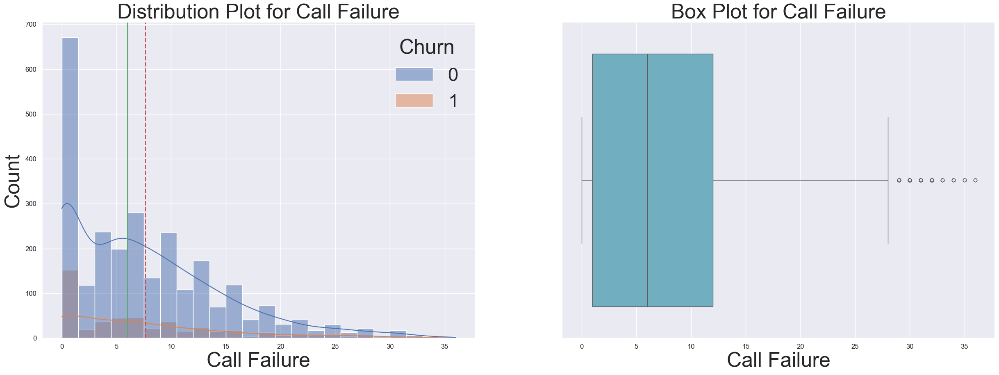

In [17]:
#plot distribution diagram and box plot for 'Call Failure'
plot_distribution_box('Call Failure')

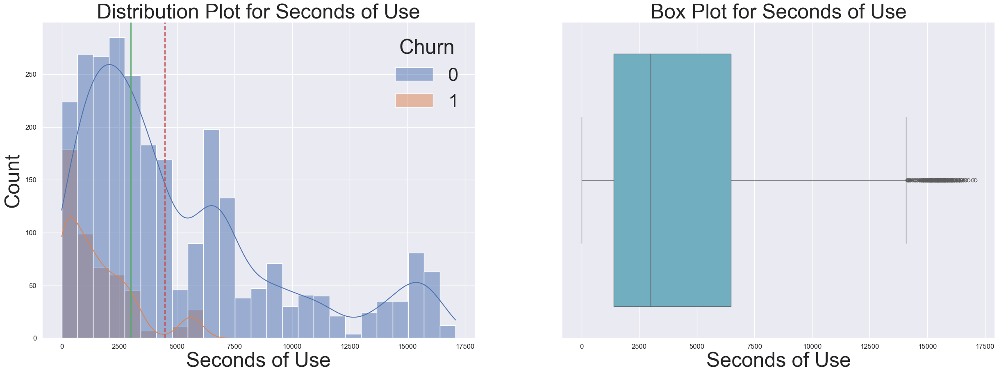

In [18]:
#plot distribution diagram and box plot for 'Seconds of Use'
plot_distribution_box('Seconds of Use')

#### 2.2.2. Seconds of Use
- **`Seconds of Use`**, range of Q1 to Q3 is from 1391.25 to 6478.25 and the mean is larger than the median
    - Seconds of Use is heavily **right-skewed**.
    - Most of the values are 0, and the amount of outliers is considerable

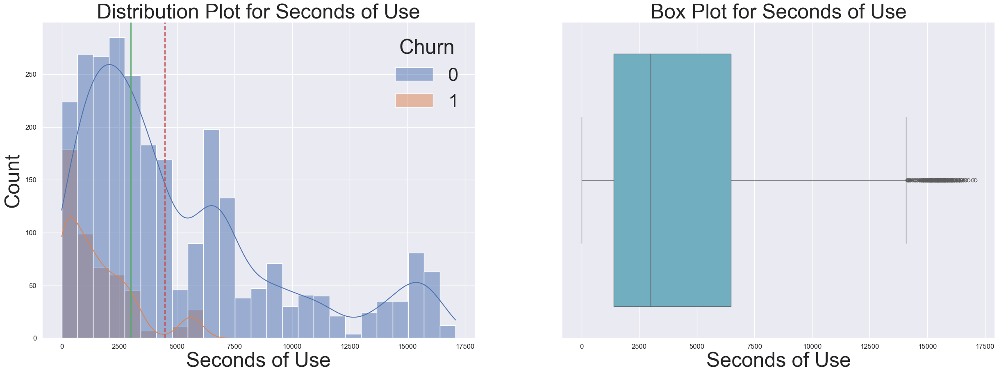

In [20]:
#plot distribution diagram and box plot for 'Seconds of Use'
plot_distribution_box('Seconds of Use')

#### 2.2.3. Frequency of Use
- **`Frequency of Use`**, range of Q1 to Q3 is from 27 to 95 and the mean is larger than the median.
    - 'Frequency of Use' is **right-skewed**.
    - There are also a significant amount of outliers.

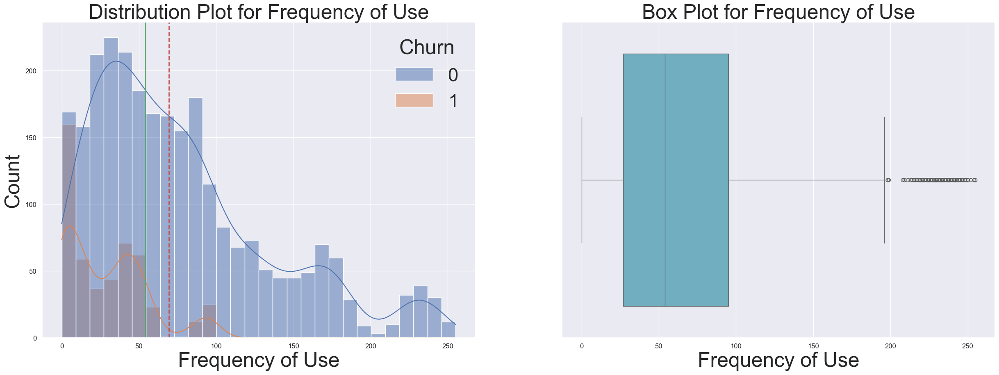

In [22]:
#plot distribution diagram and box plot for 'Frequency of Use'
plot_distribution_box('Frequency of Use')

#### 2.2.4. Frequency of SMS
- **`Frequency of SMS`**, range of Q1 to Q3 is from 6 to 87 and the mean is larger than the median.
    - 'Frequency of Use' is **right-skewed**.
    - There are also a significant amount of outliers and the majority amount of SMS is 0

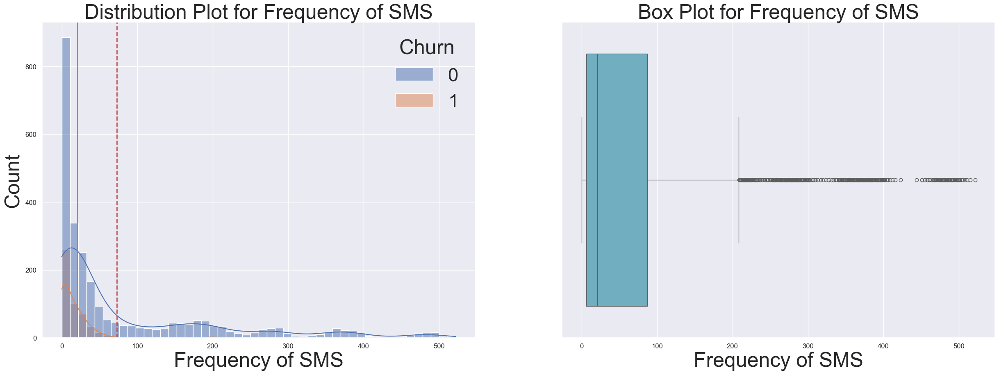

In [24]:
#plot distribution diagram and box plot for 'Frequency of SMS'
plot_distribution_box('Frequency of SMS')

#### 2.2.5. Distinct Called Numbers
- **`Distinct Called Numbers`**, range of Q1 to Q3 is from 10 to 34 and the mean is larger than the median.
    - 'Frequency of Use' is **right-skewed**.
    - There are also a significant amount of outliers

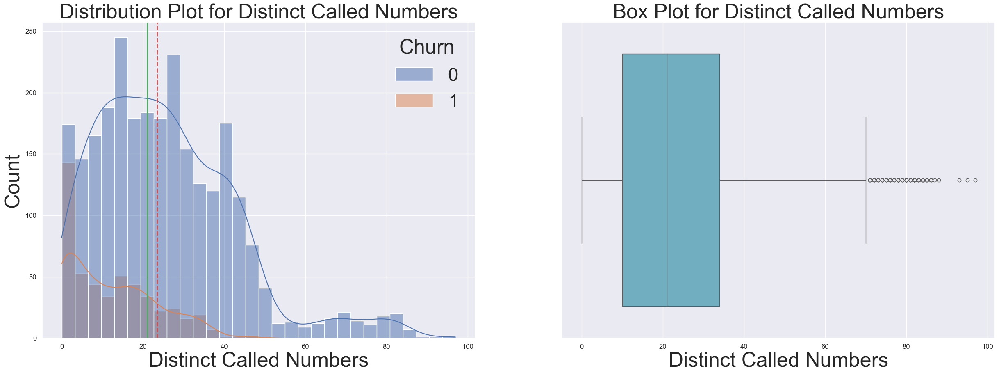

In [26]:
#plot distribution diagram and box plot for 'Distinct Called Numbers'
plot_distribution_box('Distinct Called Numbers')

#### 2.2.6. Subscription Length
- **`Subscription Length`**, range of Q1 to Q3 is from 30 to 38 and the mean is smaller than the median.
    - 'Frequency of Use' is **left-skewed**.
    - There are also many small outliers

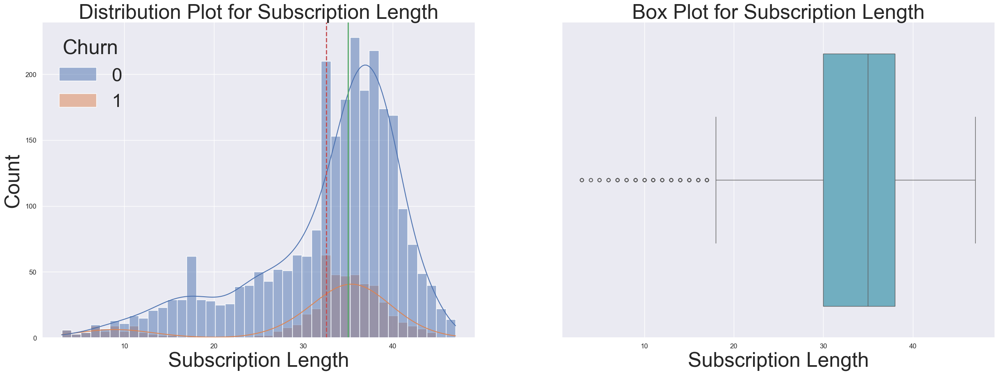

In [28]:
#plot distribution diagram and box plot for 'Subscription Length'
plot_distribution_box('Subscription Length')

#### 2.2.7. Customer Value
- **`Customer Value`, Regression Target Value**, range of Q1 to Q3 is from 113.8 to 788,38 and the mean is larger than the median.
    - 'Frequency of Use' is **right-skewed**
    - There are also a significant amount of outliers
    - The distribution is not even as the histogram line fluctuatate

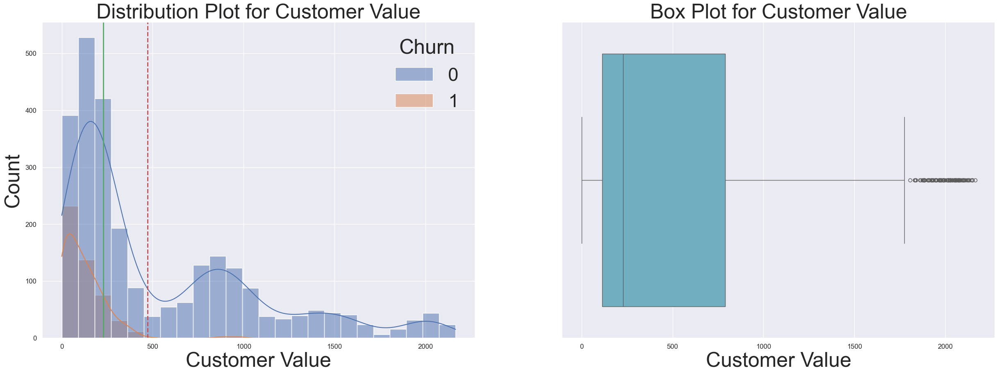

In [30]:
#plot distribution diagram and box plot for 'Customer Value'
plot_distribution_box('Customer Value')

Generally, all the numerical attribute of the dataset are not evenly distributed, with most of them are "**right-skewed**". Additionally, these attributes also recorded a high density around *0 value* and a significant amount of *upper outliers* that were far from the main distribution. 

-> This might affect the chosen models and drag the performance of the base algorithms. Certain methods will be addressed at `Modeling` Section in prior to training the models.

On the other hand, those records for churned under the same field also share the similar distribution with the whole corresponding data.


#### Observation 4 - Descriptive Statistics for non numerical variables
Descriptive statistics and diagrams for the non-numerical variables (Age Group, Charge Amount, Complains, Tariff Plan, Status, Churn)

In [33]:
# Define a function to plot custom pie chart
def custom_piechart(column, category_labels=None, font_scale=1.5):
    """
    Plot a pie chart with legends corresponding to the field values from a DataFrame.
    This function is used within this notebook only, so can only be used with the iranian df

    Parameters:
    - column: str, name of the column to plot
    - category_labels: Dictionary, a mapping of numeric categories to their corresponding labels.
    - font_scale: float, scale factor for font size

    """
    sns.set(font_scale=font_scale)
    
    column_counts = df[column].value_counts()
    
    # Extract data from DataFrame
    labels = column_counts.index
    
    # If category_labels is provided, map the numeric categories to labels
    if category_labels:
        labels = column_counts.index.map(category_labels)


    # Create a pie chart
    wedges, texts, autotexts = plt.pie(column_counts, labels=labels, autopct='%1.1f%%', startangle=90)

    # Equal aspect ratio ensures that the pie is drawn as a circle.
    plt.axis('equal')

    # Add a title
    plt.title(f'Pie chart for {column}')

    # Show the plot
    plt.show()

#### 2.2.8. Age Group
- **`Age Group`**:
    - The majority of customers are in age group '3' and '2'

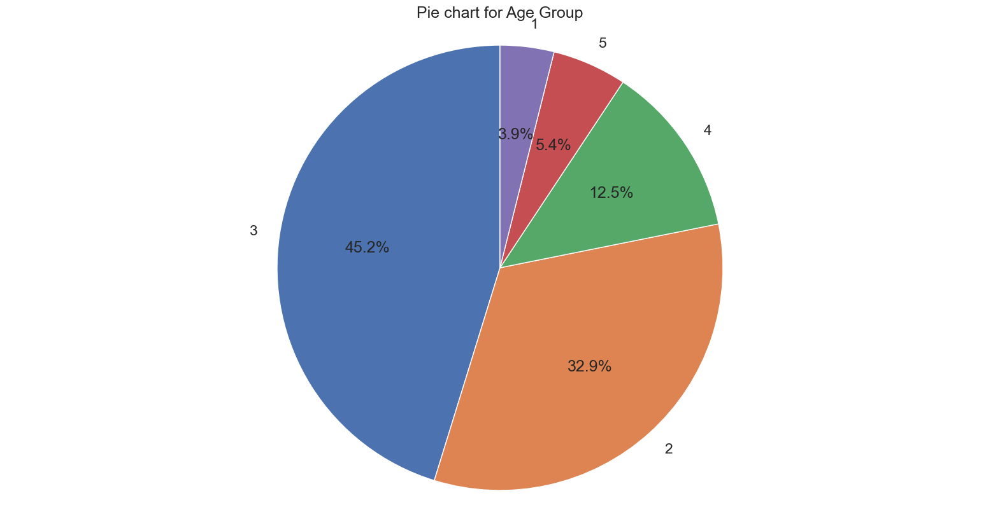

In [35]:
fig = plt.figure(figsize=(20, 10))
iranian_age_group_count = df['Age Group'].value_counts()

custom_piechart('Age Group')

In [40]:
def custom_countplot(column, legend_labels=None, order=None, palette=None, x_ticklabels=None, font_scale=1.2, figsize=(8, 6)):
    """
    Plot a count plot using Seaborn with customized legend labels.

    Parameters:
    - column: str, name of the column to plot
    - legend_labels: dict, custom legend labels (key: original value, value: custom label)
    - order: list, order of values on the x-axis
    - palette: str or list, color palette for the plot
    - x_ticklabels: dict, custom x-axis tick labels (key: original value, value: custom label)
    - font_scale: float, scale factor for font size
    - figsize: tuple, size of the figure (width, height)
    """
    sns.set(font_scale=font_scale)
    plt.figure(figsize=figsize)
    
    # Create a count plot with optional order and palette
    plot = sns.countplot(df, x=column, hue='Churn', order=order, palette=palette)
    
    # Customize legend labels
    if legend_labels:
        handles, _ = plt.gca().get_legend_handles_labels()
        labels = [legend_labels.get(label, label) for label in plt.gca().get_xticks()]
        plt.legend(handles, labels, title=column, loc='upper right', bbox_to_anchor=(1, 0.9))
    
    # Customize x-axis tick labels
    if x_ticklabels:
        tick_positions = plt.xticks()[0]
        new_ticklabels = [x_ticklabels.get(int(label), label) for label in tick_positions]
        plot.set_xticklabels(new_ticklabels)
        
        
    # Customize labels and title
    plt.title(f'Count Plot for {column}')
    plt.xlabel(f'{column}')
    plt.ylabel('Count')
    plt.show()

#### 2.2.9. Charge Amount
- **`Charge Amount`**
    - There are 10 recorded distinct values with the inclusion of value '10' while the definition states that the highest value is '9'. Need to replace records that are '10' with '9'.
    - The higher charge amount accumulates much less than the lower amount, those with 0 are the most.

In [43]:
# Count value of 'Charge Amount'
iranian_charge_amount_count = df['Charge Amount'].value_counts()

iranian_charge_amount_count.to_frame().T

Charge Amount,0,1,2,3,4,5,9,8,7,6
count,1768,617,395,199,76,30,21,19,14,11


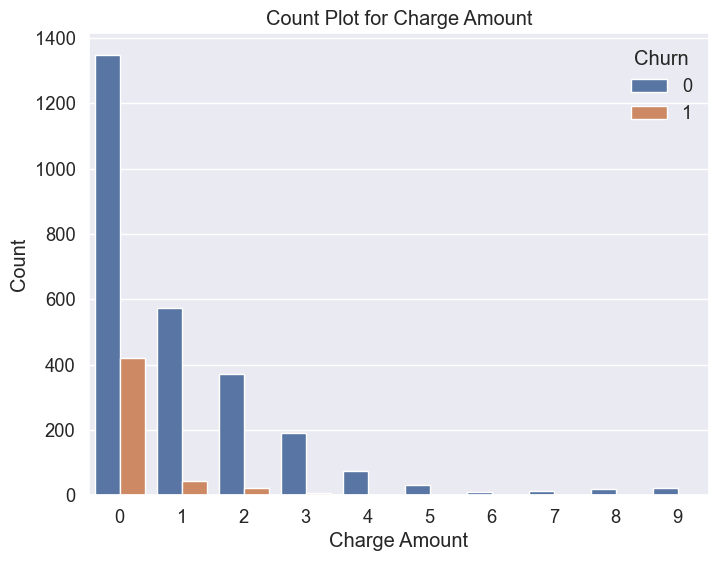

In [44]:
# Replace the records '10' with '9'
df.loc[df['Charge Amount'] == 10, 'Charge Amount'] = 9

# Plot countplot for 'Charge Amount' after modified
custom_countplot('Charge Amount')

#### 2.2.10. Complains
- **`Complains`**
    - The field is *imbalanced* with 'No Complaint' accumulated the most

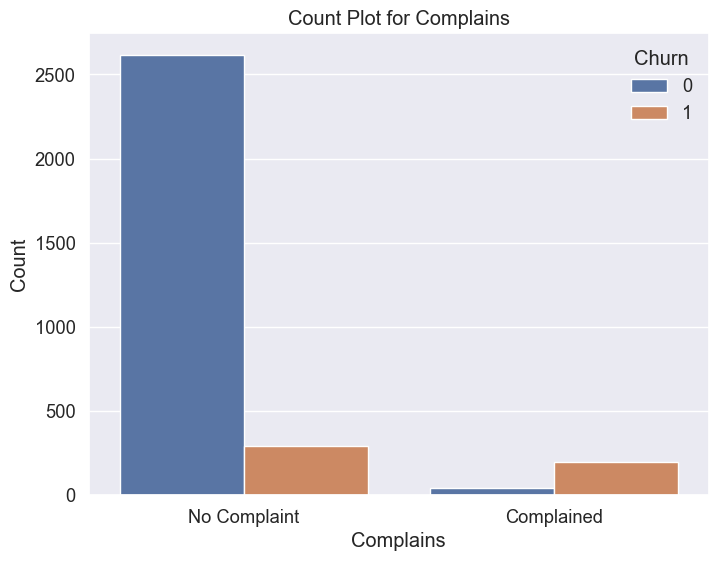

In [46]:
# Plot count plot for 'Complains'
complains_labels={0: 'No Complaint', 1: 'Complained'}
custom_countplot('Complains', x_ticklabels=complains_labels)

#### 2.2.11. Tariff Plan
- **`Tariff Plan`**
    - The field is *imbalanced* with Pay as you go' accumulated the most

Tariff Plan
1    2905
2     245
Name: count, dtype: int64

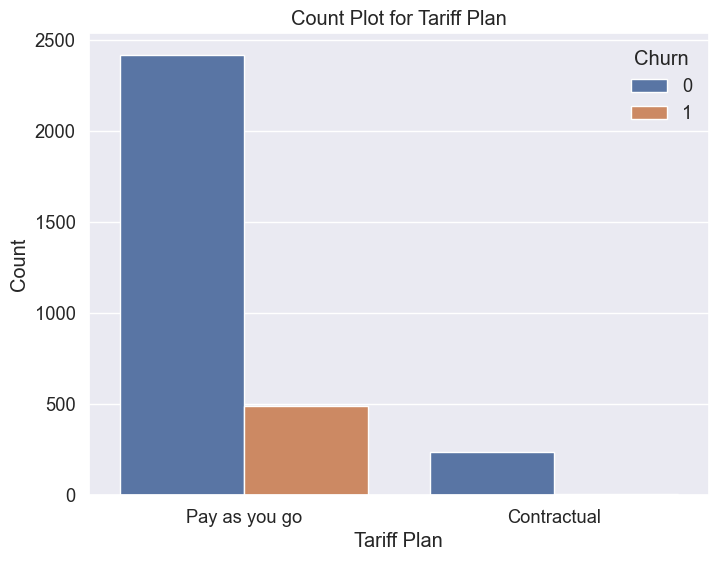

In [51]:
# Plot count plot for 'Tariff Plan'
display(df['Tariff Plan'].value_counts())

complains_labels={ 0: 'Pay as you go', 1: 'Contractual'}
custom_countplot('Tariff Plan', x_ticklabels=complains_labels)

#### 2.2.12. Status
- **`Status`**
    - The field is *imbalanced* with 'Active' accumulated the most

Status
1    2368
2     782
Name: count, dtype: int64

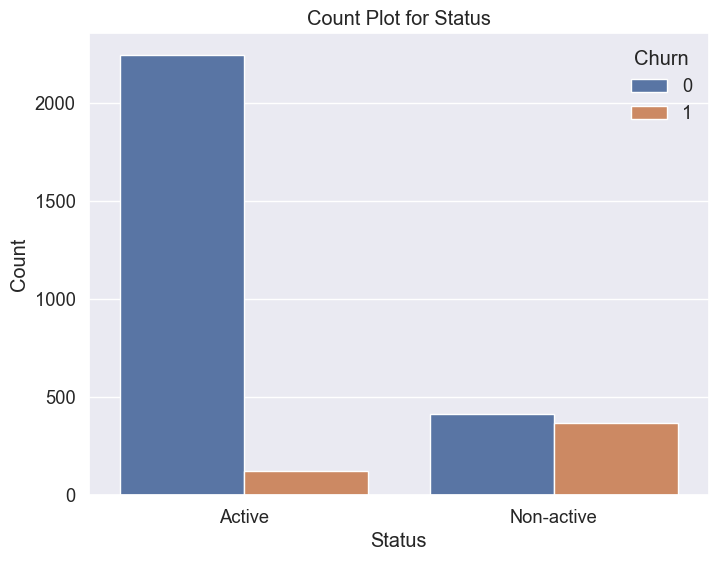

In [54]:
# Plot count plot for 'Status'
display(df['Status'].value_counts())

complains_labels={ 0: 'Active', 1: 'Non-active'}
custom_countplot('Status', x_ticklabels=complains_labels)

#### 2.2.13. Churn
- **`Churn`**
    - **Target value** for classification models
    - The field is *imbalanced* with 'Non-churn' accumulated the most

Churn
0    2655
1     495
Name: count, dtype: int64

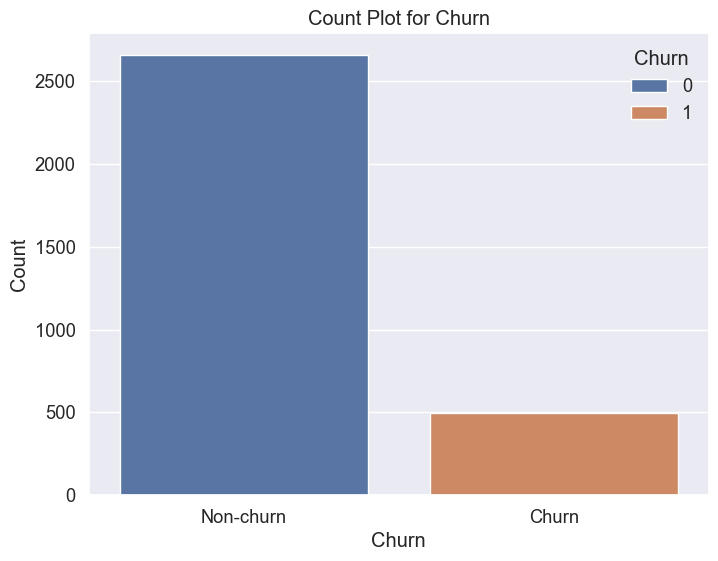

In [57]:
# Plot count plot for 'Churn'
display(df['Churn'].value_counts())

complains_labels={ 0: 'Non-churn', 1: 'Churn'}
custom_countplot('Churn', x_ticklabels=complains_labels)

In general, all of these categorical attributes are heavily **imbalanced**.

### 2.3. Features Correlation

#### 2.3.1. Features pairplot

In [60]:
# Pairplot for all the attribute with hue as 'Churn'
pairplt=df.copy()
pairplt['Churn'] = pairplt['Churn'].replace({0: 'Non-churn', 1: 'churn'})
sns.set(font_scale=5)
sns.pairplot(pairplt, hue = 'Churn', height=10)

#### Observation 5: From pairplots
* `Frequency of Use` and `Seconds of Use` have strong positive correlation.
* `Customer Value` and `Frequency of SMS` have strong positive correlation.
*  It can be seen that there are more `Churn` appeared in `Non-active` customers.
* `Customer Value` seems to be higher and more for `Active` customers. Similarly, those use *Pay as you go* as the `Tariff Plan` also had higher `Customer Value`.
* The distribution of `Churn` can be seen more clearly that the figure had the similar distribution pattern regarding the total of each attribute

#### 2.3.2. Correlation Matrix

Text(0.5, 1.0, 'Correlation Matrix of Data')

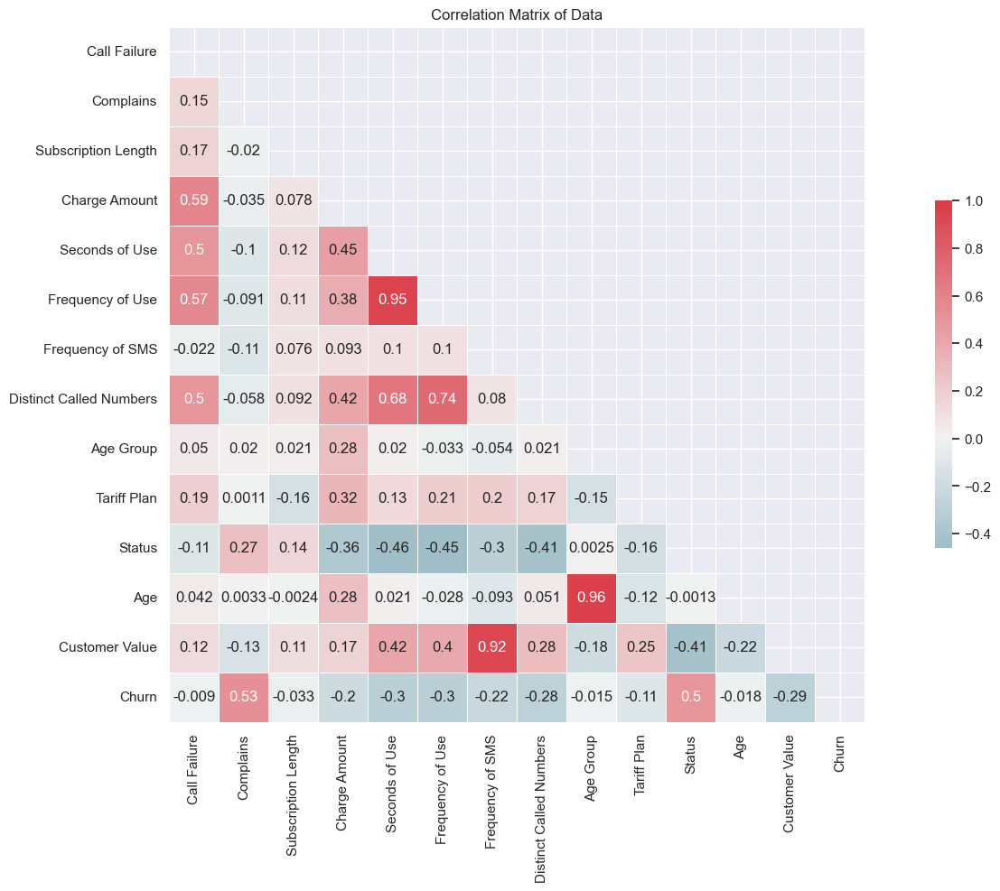

In [70]:
# Plot Correlation Matrix of all attributes
corr = df.corr()

mask = np.zeros_like(corr, dtype = bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize = (20, 10))

cmap = sns.diverging_palette(220, 10, as_cmap = True)

sns.heatmap(corr, mask = mask, cmap = cmap, vmax = 1, center = 0, square = True, 
            linewidths = .5, cbar_kws = {"shrink": .5}, annot = True)
ax.set_title('Correlation Matrix of Data')

#### Observation 6
* `Call Failure`, `Subscription Length`, `Age Group`, and `Age` have really low correlation with the target `Churn`. It is considerable to drop these attributes when training models for `Churn`
* `Age` and `Age Group` have a high correlation. Since they basically displayed the same information, *need to examine the relationship of these two*.

#### 2.3.3. Churn and Status

<Axes: xlabel='Status', ylabel='count'>

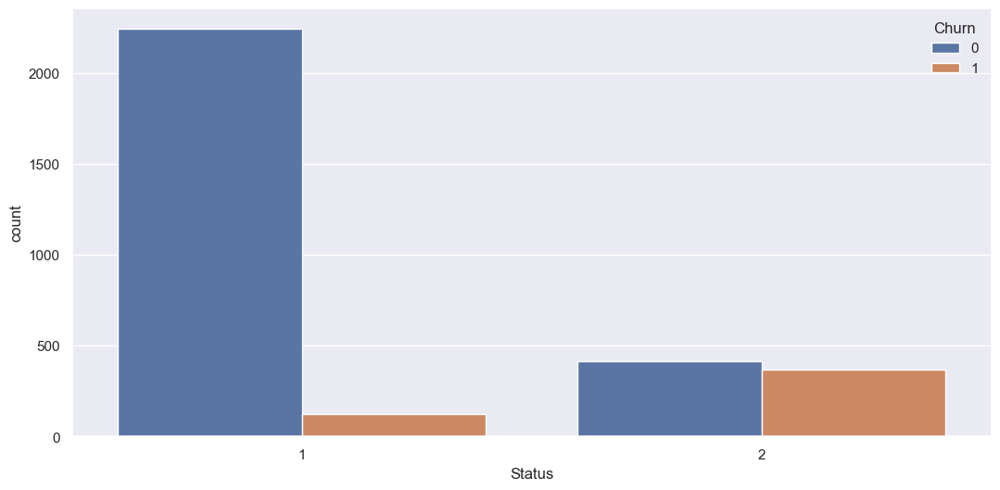

In [73]:
# Countplot of Churn by Status
plt.figure(figsize = (12.8 , 6))
sns.countplot(x='Status', hue ='Churn', data = df)

- There are more `Churn` customers within those that are `Non-active`. `Active` customers are more likely to keep their subscription.

#### 2.3.4. Age and Age Group

<Axes: xlabel='Age Group', ylabel='count'>

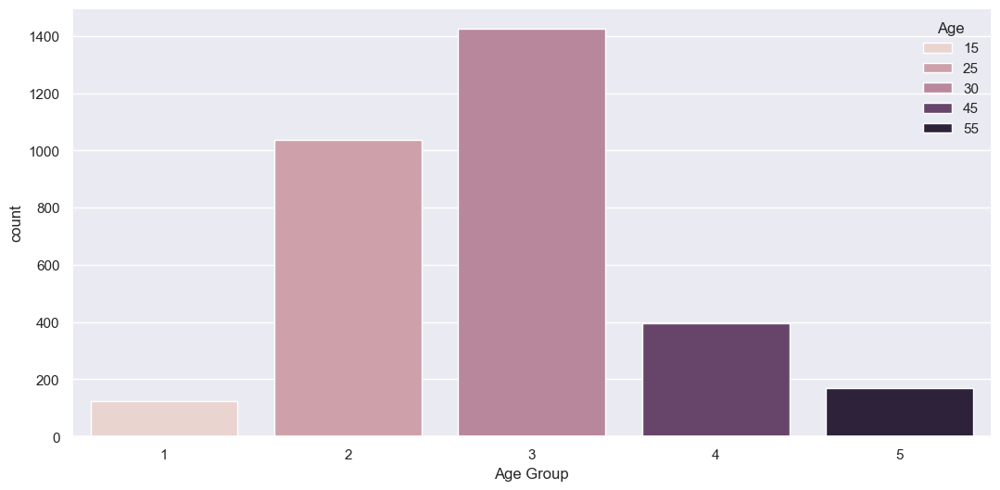

In [81]:
# Countplot of Age by Age Group
plt.figure(figsize = (12.8 , 6))
sns.countplot(x='Age Group', hue ='Age', data = df)

- Although `Age` being a numerical data, it has only 5 unique values correspond to the amount of `Age Group` categories. They can be treated as the same since their correlation (shown in the above correlation map) with the two *target values* are not much different.

- Drop the `Age` column is reasonable.

In [84]:
df = df.drop(['Age'], axis=1)

## 3. Modelling

In [ ]:
sm = SMOTE()
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

# Before oversampling
unique, counts = np.unique(y_train, return_counts = True)
print(np.asarray((unique, counts)).T)

# After oversampling
unique, counts = np.unique(y_train_res, return_counts = True)
print(np.asarray((unique, counts)).T)

### Classifier for Churn

In [91]:
# Examine current columns
df.columns

Index(['Call Failure', 'Complains', 'Subscription Length', 'Charge Amount',
       'Seconds of Use', 'Frequency of Use', 'Frequency of SMS',
       'Distinct Called Numbers', 'Age Group', 'Tariff Plan', 'Status',
       'Customer Value', 'Churn'],
      dtype='object')

In [93]:
# Determine the target value and used dataset
X_churn = df.drop(['Churn'], axis = 1)
y_churn = df['Churn']

display(X_churn.describe().T,X_churn.shape, y_churn.shape)

,count,mean,std,min,25%,50%,75%,max
Call Failure,3150.0,7.627937,7.263886,0.0,1.00000,6.00,12.00000,36.00
Complains,3150.0,0.076508,0.265851,0.0,0.00000,0.00,0.00000,1.00
Subscription Length,3150.0,32.541905,8.573482,3.0,30.00000,35.00,38.00000,47.00
Charge Amount,3150.0,0.940635,1.508513,0.0,0.00000,0.00,1.00000,9.00
Seconds of Use,3150.0,4472.459683,4197.908687,0.0,1391.25000,2990.00,6478.25000,17090.00
Frequency of Use,3150.0,69.460635,57.413308,0.0,27.00000,54.00,95.00000,255.00
Frequency of SMS,3150.0,73.174921,112.237560,0.0,6.00000,21.00,87.00000,522.00
Distinct Called Numbers,3150.0,23.509841,17.217337,0.0,10.00000,21.00,34.00000,97.00
Age Group,3150.0,2.826032,0.892555,1.0,2.00000,3.00,3.00000,5.00
Tariff Plan,3150.0,1.077778,0.267864,1.0,1.00000,1.00,1.00000,2.00


(3150, 12)

(3150,)

As mentioned above, `Call Failure`, `Subscription Length`, `Age Group` (`Age` has already been dropped) do not contribute much to the value of `Churn`. Dropping them is reasonable as it also save the computational resources while training the models.

In [96]:
X_churn = X_churn.drop(['Call Failure', 'Subscription Length', 'Age Group' ], axis=1)

During the analysis, it can be seen that all the attributes are **heavily skewed** and values range are significantly different. Therefore, to make the models perform better, scaling with **Normalization** is necessary.

In [103]:
# Transformation and Scale
scaler = preprocessing.MinMaxScaler()

X_churn = scaler.fit_transform(X_churn)

#### Utilities

In [110]:
# Define a function to train and show the evaluation for classifiers
def train_and_evaluate_classifier(model, X_train, y_train, X_test, y_test, grid=False):

    model.fit(X_train, y_train)

    print('Model accuracy for train set: {0:.3f}'.format(model.score(X_train, y_train)))
    print('Model accuracy for test set: {0:.3f}'.format(model.score(X_test, y_test)))

    if grid == True:
        print(f'Best params for the model: {model.best_params_}')
    
    y_pred = model.predict(X_test)
    
    sns.set(font_scale=1)

    # Classification Report
    print('\n{}'.format(classification_report(y_test, y_pred)))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    print('\nConfusion Matrix:\n', cm)

    # Accuracy Score
    auc = accuracy_score(y_test, y_pred)
    print('\nAccuracy Score: ', auc.round(3))

    # ROC Curve
    model_roc_auc = roc_auc_score(y_test, model.predict(X_test))
    fpr, tpr, thresholds = roc_curve(y_test, model.predict_proba(X_test)[:,1])
    plt.figure(figsize = (12.8 , 6))
    plt.plot(fpr, tpr, label = 'AUC = {})'.\
             format(model_roc_auc.round(4)))
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc = 'lower right')
    plt.show()
    
    return model

### 3.1. Logistic Regression
First approach for the **Churn Classifier** is **`Logistic Regression`**, train it with default parameters first.

In [107]:
# Splitting the data into training and test set in the ratio of 70:30 respectively
X_churn_train, X_churn_test, y_churn_train, y_churn_test = train_test_split(X_churn, y_churn, test_size = 0.3, random_state = 0)
display(X_churn_train.shape, X_churn_test.shape, y_churn_train.shape, y_churn_test.shape)

(2205, 9)

(945, 9)

(2205,)

(945,)

Model accuracy for train set: 0.905
Model accuracy for test set: 0.886

              precision    recall  f1-score   support

           0       0.88      0.99      0.93       776
           1       0.93      0.39      0.55       169

    accuracy                           0.89       945
   macro avg       0.91      0.69      0.74       945
weighted avg       0.89      0.89      0.87       945


Confusion Matrix:
 [[771   5]
 [103  66]]

Accuracy Score:  0.886


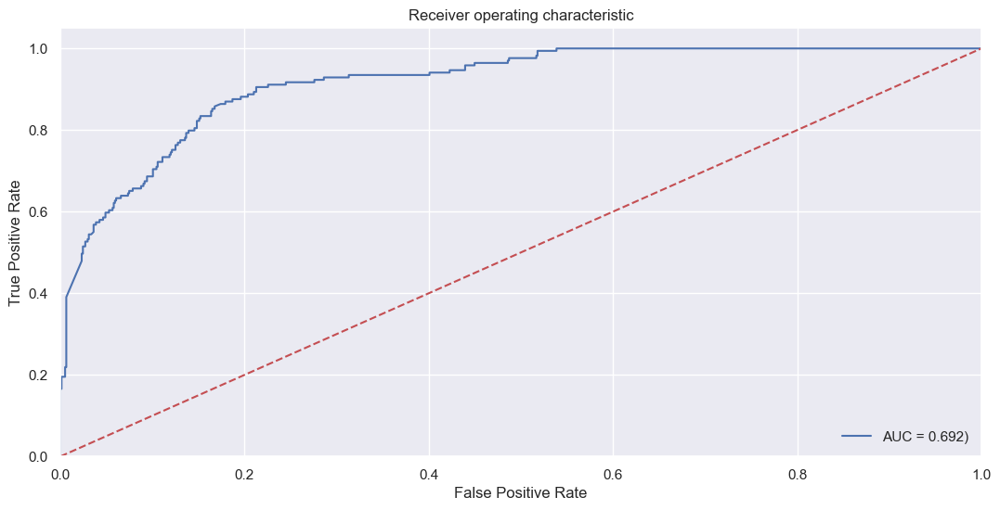

In [112]:
# LR model without hyperparameter tuning
LR = LogisticRegression()
model1 = train_and_evaluate_classifier(LR, X_churn_train, y_churn_train, X_churn_test, y_churn_test)

To hypertune the model, I use `GridSearchCV` to find the best set of parameters:
- The target value, `Churn`, is ***imbalanced***, I put **class_weight: balanced** in the grid for the algorithm to try

Model accuracy for train set: 0.851
Model accuracy for test set: 0.837
Best params for the model: {'C': 0.01, 'class_weight': 'balanced', 'max_iter': 100, 'penalty': 'l2'}

              precision    recall  f1-score   support

           0       0.96      0.84      0.89       776
           1       0.53      0.84      0.65       169

    accuracy                           0.84       945
   macro avg       0.74      0.84      0.77       945
weighted avg       0.88      0.84      0.85       945


Confusion Matrix:
 [[649 127]
 [ 27 142]]

Accuracy Score:  0.837


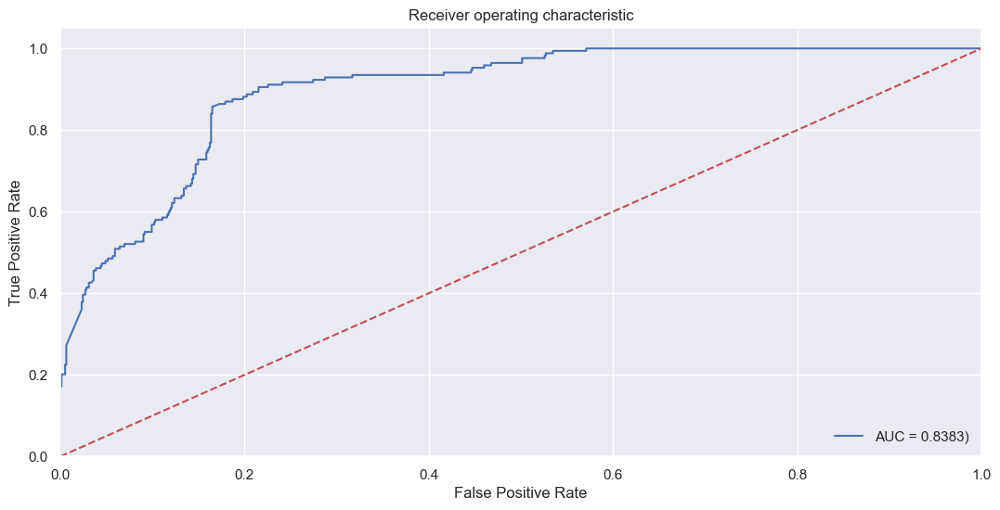

In [117]:
# LR model with hyperparameter tuning
LR = LogisticRegression()

params = {'penalty': ['l1', 'l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100], 'max_iter': [100, 500, 1000], 'class_weight': ['balanced']}

skf = StratifiedKFold(n_splits = 10)
LR_hyper = GridSearchCV(LR, param_grid = params, n_jobs = -1, cv = skf)

model2 = train_and_evaluate_classifier(LR_hyper, X_churn_train, y_churn_train, X_churn_test, y_churn_test, grid=True)

### 3.2. K-Nearest Neighbors
Second approach for the **Churn Classifier** is **`KNeighbors`**, train it with default parameters first.

Model accuracy for train set: 0.946
Model accuracy for test set: 0.928

              precision    recall  f1-score   support

           0       0.95      0.97      0.96       776
           1       0.83      0.75      0.79       169

    accuracy                           0.93       945
   macro avg       0.89      0.86      0.87       945
weighted avg       0.93      0.93      0.93       945


Confusion Matrix:
 [[750  26]
 [ 42 127]]

Accuracy Score:  0.928


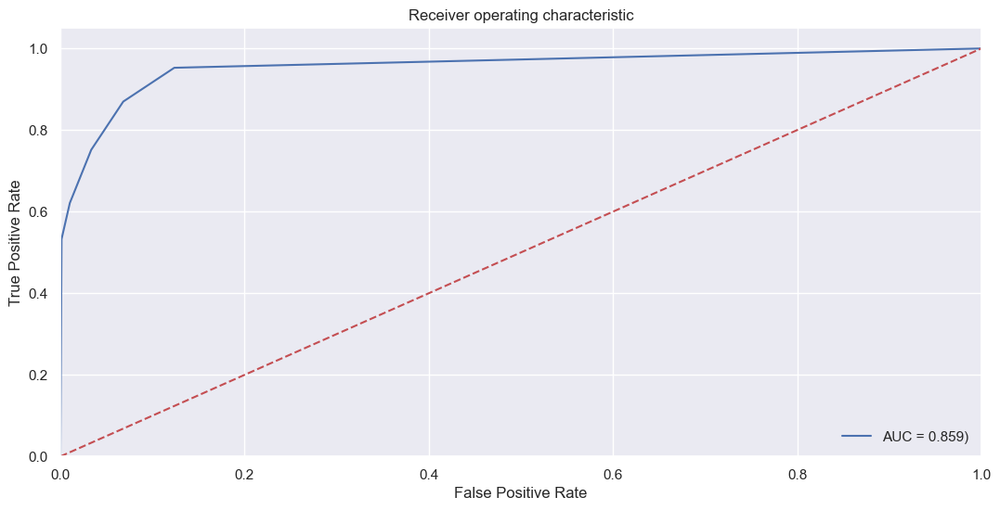

In [120]:
# KNN without hyperparameter tuning
KNN = KNeighborsClassifier()

model3 = train_and_evaluate_classifier(KNN, X_churn_train, y_churn_train, X_churn_test, y_churn_test)

Model accuracy for train set: 0.984
Model accuracy for test set: 0.935
Best params for the model: {'algorithm': 'auto', 'leaf_size': 20, 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}

              precision    recall  f1-score   support

           0       0.96      0.96      0.96       776
           1       0.83      0.81      0.82       169

    accuracy                           0.94       945
   macro avg       0.89      0.89      0.89       945
weighted avg       0.94      0.94      0.94       945


Confusion Matrix:
 [[747  29]
 [ 32 137]]

Accuracy Score:  0.935


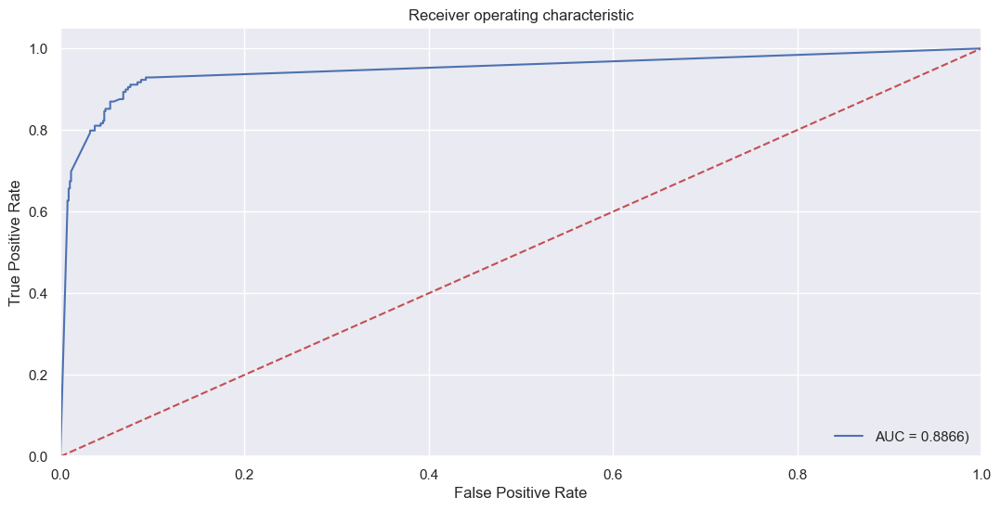

In [122]:
# KNN with hyperparameter tuning
param_grid = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'p': [1, 2],  # 1 for Manhattan distance (L1), 2 for Euclidean distance (L2)
    'leaf_size': [10, 20, 30],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}

skf = StratifiedKFold(n_splits = 10)
KNN_hyper = GridSearchCV(KNN, param_grid, n_jobs = -1, cv = skf)

model4 = train_and_evaluate_classifier(KNN_hyper, X_churn_train, y_churn_train, X_churn_test, y_churn_test, grid=True)

### Comparison and Conclusion

Use **AUC** value as the ultimate metrics since it shows which models can make the prediction better independently.

- As shown below, **model 4** has the highest value of all. On the other hand according to the confusion matrix **model 4** also predicts *both Churn classes* better.

| Models      | ROC AUC|
|-------------|----|
| **1. Logistic Regression** | 0.692 |
| **2. Logistic Regression with Hyperparameter Tuning** | 0.8383 |
| **3. k-Nearest Neighbors** | 0.859 |
| **4. k-Nearest Neighbors with Hyperparameter Tuning** | 0.8866 |